In [2]:
import sys
sys.path.append('../')
import gc
import jax
import jax.numpy as jnp
import numpy as np
from lucid.AbsorptionSIREN.siren_train import train, target_fn
from lucid.AbsorptionSIREN.siren_loader import setup_siren, save_siren_params, load_siren_params, make_absorption_fn
from lucid.AbsorptionSIREN.visualize_3d import plot_interactive_plotly, plot_interactive_comparison

In [8]:
# Create a params file

params = train(
    n_steps=15000,
    n_lines=1000,
    n_pts_per_line=20,
    lr=5e-4,
    seed=0,
    output_path="../lucid/AbsorptionSIREN/siren_params4.npz",
    plot=True,
)

#save_siren_params(params, "siren_params.npz")

JAX compilation (first step)...
  Compilation in 4.2s

  Step         Train      Train L2        Val L2    Time (s)
────────────────────────────────────────────────────────────
     0     0.3980941     0.5235941     0.5484938       0.005s


KeyboardInterrupt: 

[siren_loader] Parameters loaded from ../lucid/AbsorptionSIREN/siren_params4.npz
[1.2986497]


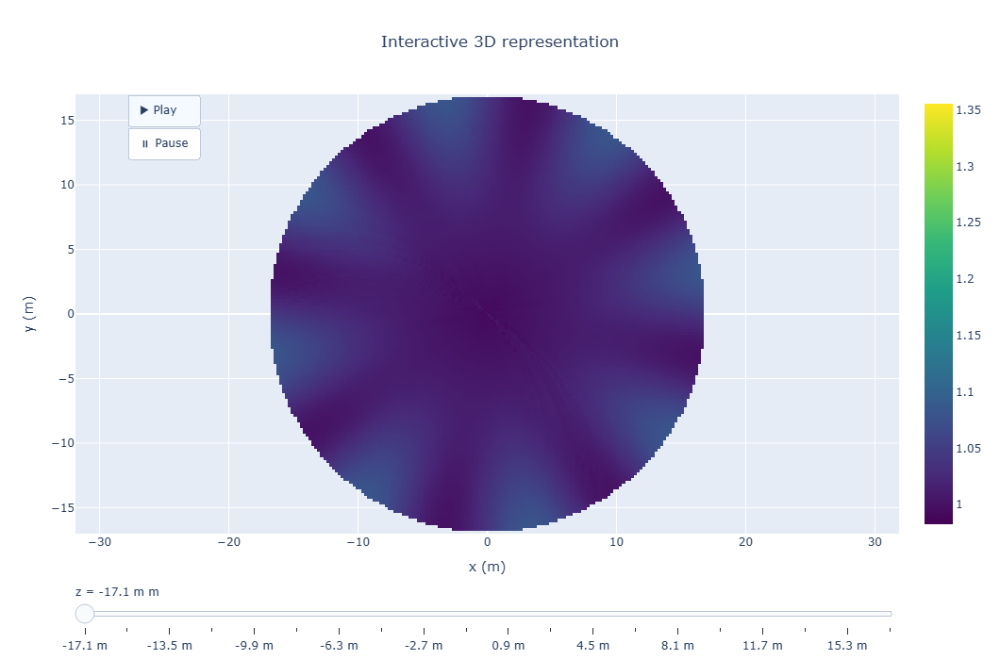

In [7]:
model, params = setup_siren("../lucid/AbsorptionSIREN/siren_params4.npz")
absorption_fn = make_absorption_fn(model)
print(absorption_fn(jnp.array([[16.0, 0.0, 17.0]]), params))
plot_interactive_plotly(lambda x: absorption_fn(x, params))

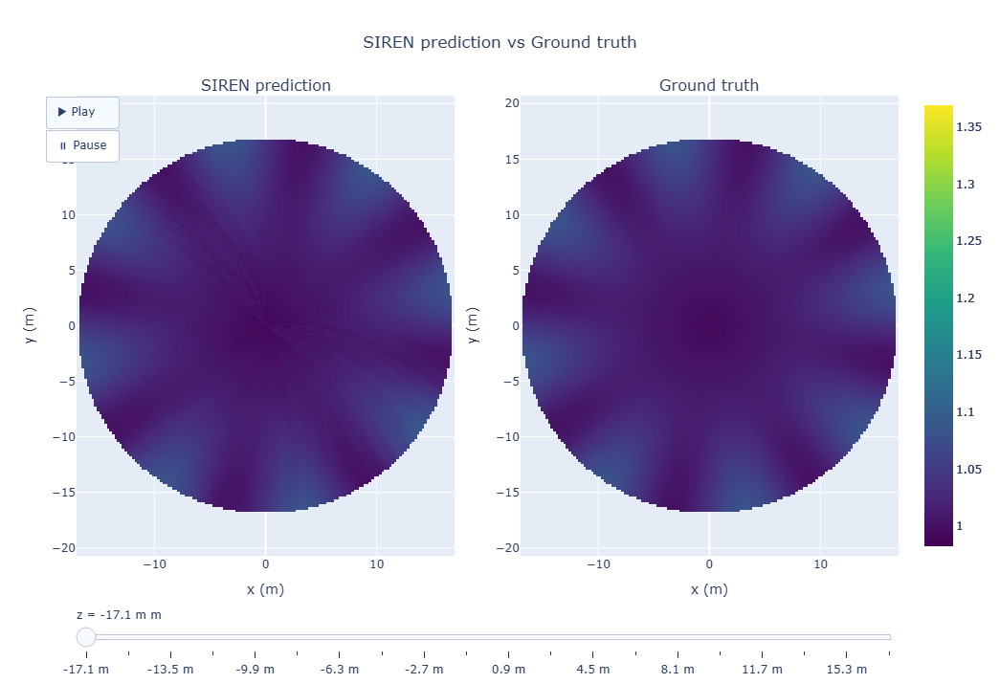

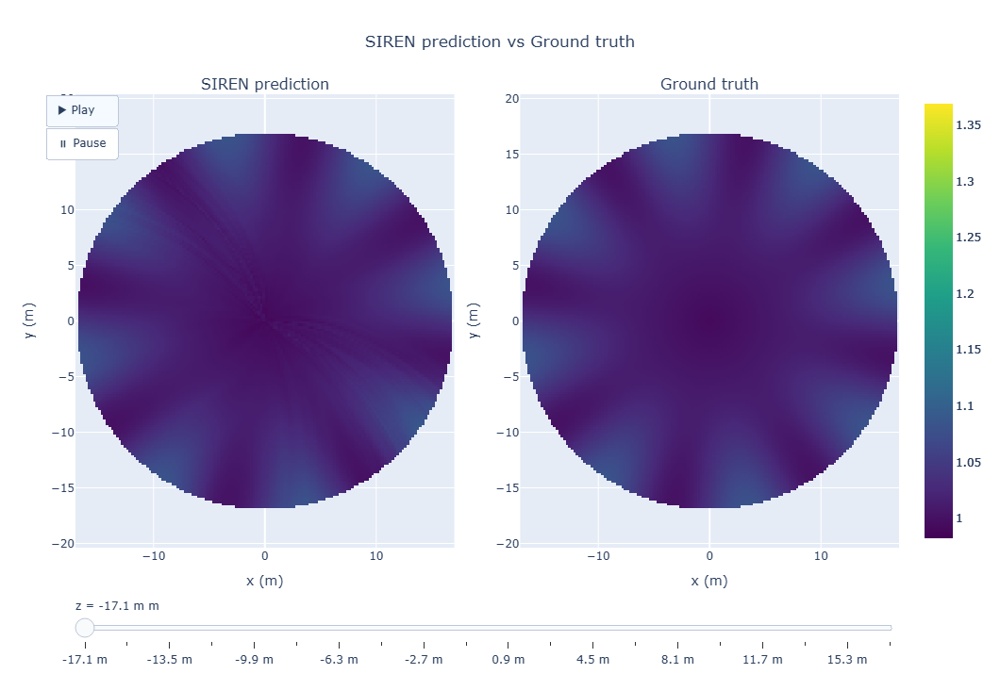

In [4]:
plot_interactive_comparison(lambda x: absorption_fn(x, params), target_fn)